In [2]:
from collections import OrderedDict
import glob
import matplotlib.pyplot as plt
plt.rcParams.update({"font.size":12})
import numpy as np
import os
import pandas as pd
import pickle as pkl

import cv2
from sklearn import linear_model
import torch
import torch.nn as nn
import torch.optim
import torch.utils.data
import torch.backends.cudnn
import torchvision.utils
import torchvision.transforms

from dataloader import image_loader, load_demo
from setup import out_dir, data_dir, image_dir, model_dir, proj_dir

import util_image
from util_model import my_loss
from M1_util_train_test import load_model, test, train
import util_plot

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Model Setup

In [3]:
model_type = 'SAE'
load_model_name = 'Autoencoder'
zoomlevel = 'zoom13'
output_dim = 1
model_run_date = '22021402'
sampling = 'stratified'
normalization = 'minmax'
data_version='1571'

variable_names = ['trpgen','active','auto','mas','pt']

demo_variables = ['tot_population','pct25_34yrs','pct35_50yrs','pctover65yrs',
         'pctwhite_alone','pct_nonwhite','pctblack_alone',
         'pct_col_grad','avg_tt_to_work','inc_per_capita']

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


## Load Model

In [45]:
# Check one model exists for this config
model_path = glob.glob(model_dir+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+model_run_date+"_*.pt")
#
if len(model_path) == 1:
    saved = torch.load(model_path[0])
    print(model_path[0], "loaded.")
else:
    print("Error. More than one model or no model exists.")
    print(model_path)
    print(model_dir+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+model_run_date+"_*.pt")

/mnt/qingyi/image_chicago/models/SAE_zoom13_2048_22021402_80.pt loaded.


In [46]:
if "config" in saved.keys():
    config = saved['config']
    model_config = config['model_config']
    data_config = config['data_config']
    optim_config = config['optim_config']
    run_config = config['run_config']

In [47]:
# load model
config['model_config']['input_shape'] = (1,3,data_config['image_size'],data_config['image_size'])

encoder = load_model(config['model_config']['arch'], 'Encoder', config['model_config'])

config['model_config']['input_shape'] = [1,2048,config['model_config']['output_dim'],config['model_config']['output_dim']]

config['model_config']['conv_shape'] = [data_config['image_size']//32,data_config['image_size']//32]
config['model_config']['output_channels'] = 3

decoder = load_model(config['model_config']['arch'], 'Decoder', config['model_config'])

config['encoder'] = encoder
config['decoder'] = decoder

model = load_model('autoencoder','Autoencoder', config)
model.load_state_dict(saved['model_state_dict']);

model = model.to(device)
model.eval();

## Load Data

In [7]:
demo_cs, demo_np = load_demo_v1(data_dir, norm=normalization)

In [8]:
train_loader, test_loader = image_loader(image_dir+zoomlevel+"/", data_dir, optim_config['batch_size'], run_config['num_workers'], 
                                         data_config['image_size'], data_version=data_version,
                                         sampling=sampling, recalculate_normalize=False)


14139 images in dataset
1571 images in dataset


## Output

In [9]:
criterion = my_loss
out_image, out_demo = test(0, model, criterion, test_loader, (demo_cs,demo_np), run_config, None, device, 
                           None, return_output=True)


Epoch 0 Test Loss 0.65474639


In [7]:
all_test_images = []
for s,(i,d) in enumerate(test_loader):
    all_test_images += i

NameError: name 'test_loader' is not defined

## 0. Image Regeneration from Aggregated Embeddings

In [22]:
with open(proj_dir+"latent_space/"+model_type+"_"+zoomlevel+"_"+str(model_config['output_dim']**2*2048)+"_"+
                       model_run_date+".pkl", "rb") as f:
    encoder_output = pkl.load(f)
    im = pkl.load(f)
    ct = pkl.load(f)

In [23]:
unique_ct = list(set(ct))
unique_ct.sort()
ct = np.array(ct)
aggregate_embeddings = []
for i in unique_ct:
    aggregate_embeddings.append(np.mean(encoder_output[ct == i], axis=0))

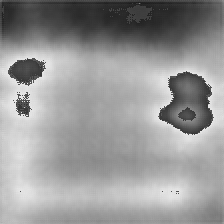

In [28]:
from torchvision import transforms
# for i in range(30):#len(aggregate_embeddings)):
i = 100
decoder_in = torch.tensor(aggregate_embeddings[i])
decoder_in = decoder_in.view(1, -1, model_config['output_dim'], model_config['output_dim']).to(device)
reconstruct = decoder(decoder_in)[0]
im = transforms.ToPILImage()(reconstruct).convert("L")
# im.save(out_dir+"image_samples/latent_regen/"+model_type+"_"+zoomlevel+"_"+str(model_config['output_dim']**2*2048)+"_"+
#                    model_run_date+"_"+str(unique_ct[i])+".png", bbox_inches='tight')
im

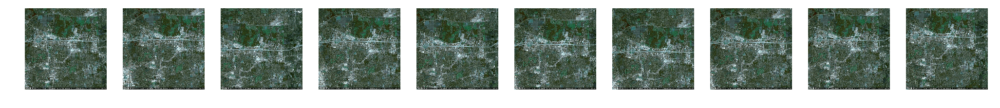

In [29]:
geoid = ct[i]
images_list = [cv2.imread(image_dir+zoomlevel+"/"+geoid+"_"+str(j)+".png") for j in range(10)]
util_plot.plot_images(1, 10, images_list, mag=3)
plt.show()

## 1. Image Samples with High/Low Demo Variable Values

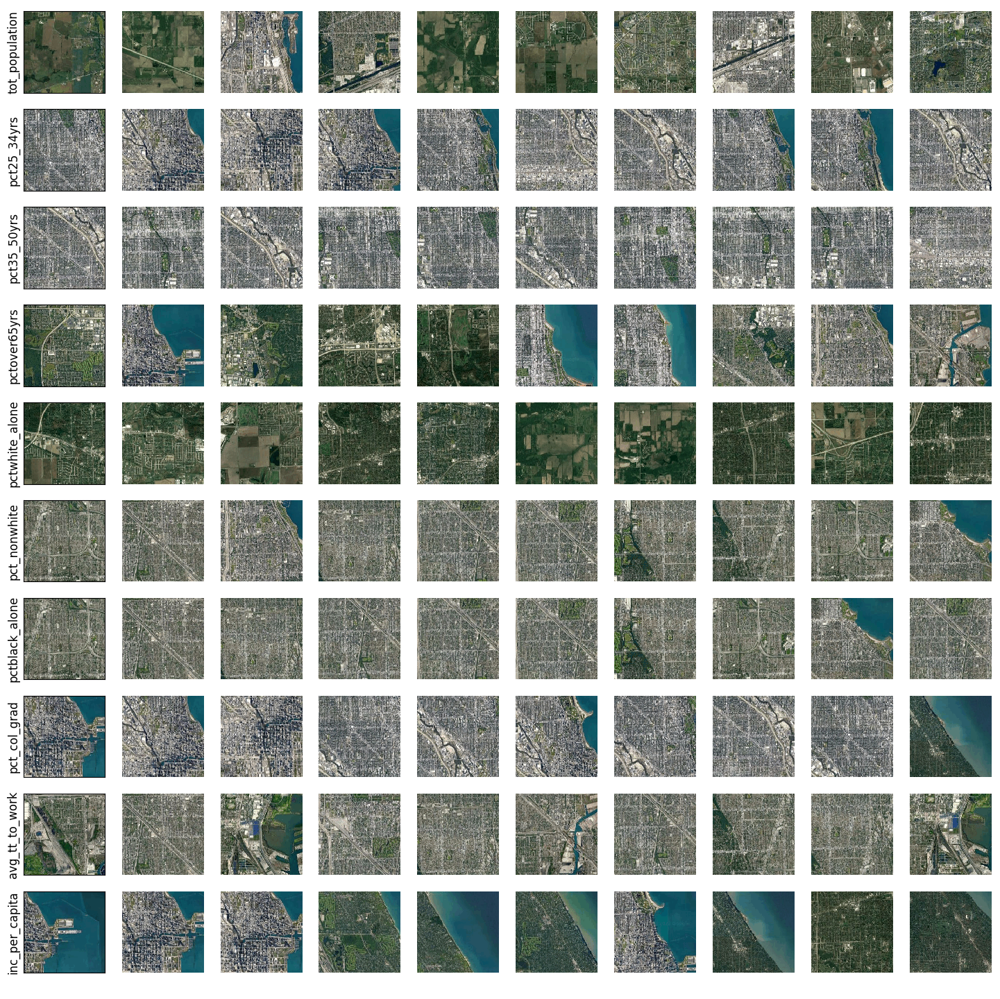

In [47]:
fig, ax = plt.subplots(model_config['num_demo_vars'],10,figsize=(18,18))
for i,ylab in zip(range(model_config['num_demo_vars']), demo_variables):
    top_thresh = np.percentile(out_demo[:,i], 99)
    for j,k in zip(np.arange(10), np.array(all_test_images)[out_demo[:,i] > top_thresh]):
        ax[i,j].imshow(util_image.center_crop(plt.imread(k), (data_config['image_size'], data_config['image_size'])))
        if j != 0:
            ax[i,j].axis('off')
        else:
            # make xaxis invisible
            ax[i,j].xaxis.set_visible(False)
            # make spines (the box) invisible
            #plt.setp(axes[1,0].spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax[i,j].tick_params(left=False, labelleft=False)
            #remove background patch (only needed for non-white background)
            #axes[1,0].patch.set_visible(False)
        ax[i,0].set_ylabel(ylab)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
# fig.savefig(out_dir+"image_samples/"+model_type+"_"+zoomlevel+"_"+str(model_config['output_dim']**2*2048)+"_"+
#                        model_run_date+"_max.png", bbox_inches='tight')
fig

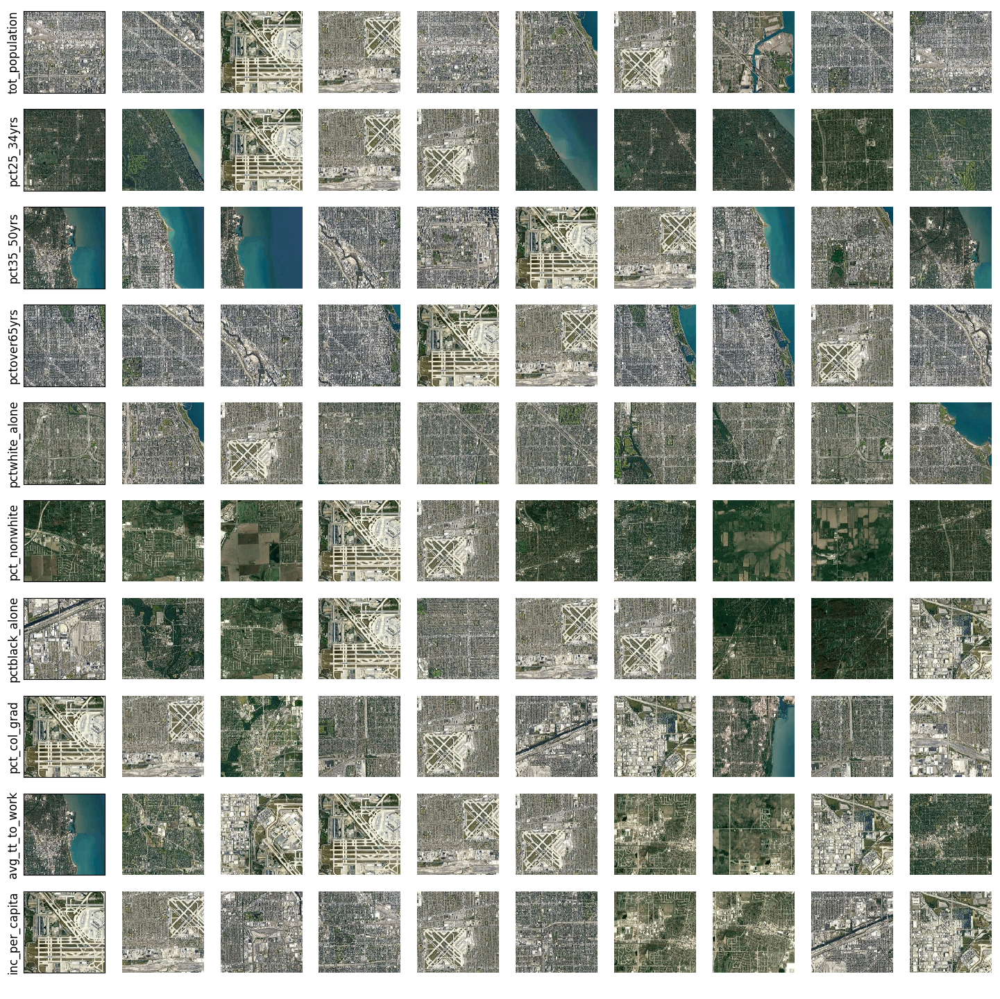

In [52]:
fig, ax = plt.subplots(model_config['num_demo_vars'],10,figsize=(18,18))
for i,ylab in zip(range(model_config['num_demo_vars']), demo_variables):
    bot_thresh = np.percentile(out_demo[:,i], 1)
    for j,k in zip(np.arange(10), np.array(all_test_images)[out_demo[:,i] < bot_thresh]):
        ax[i,j].imshow(util_image.center_crop(plt.imread(k), (data_config['image_size'], data_config['image_size'])))
        if j != 0:
            ax[i,j].axis('off')
        else:
            # make xaxis invisible
            ax[i,j].xaxis.set_visible(False)
            # make spines (the box) invisible
            #plt.setp(axes[1,0].spines.values(), visible=False)
            # remove ticks and labels for the left axis
            ax[i,j].tick_params(left=False, labelleft=False)
            #remove background patch (only needed for non-white background)
            #axes[1,0].patch.set_visible(False)
        ax[i,0].set_ylabel(ylab)

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
# fig.savefig(out_dir+"image_samples/"+model_type+"_"+zoomlevel+"_"+str(model_config['output_dim']**2*2048)+"_"+
#                        model_run_date+"_min.png", bbox_inches='tight')

fig

## 2. Optimize Input Image for Demographic Variables

In [7]:
from util_feature_viz_opt import GenImagebyOpt
from PIL import Image

In [55]:
GenImage = GenImagebyOpt(model)
iterations = 200
target_var = 6
target_var_val = 0
random = False
load_feature_viz = False

In [28]:
image_list = []

if random:
    for iterator in range(10):
        image_list.append(np.random.choice(all_test_images))
elif load_feature_viz:
    load_target_var = 0
    load_iterations = 200
    load_target_var_val = 0
    # load from feature viz
    files = glob.glob(out_dir+"image_samples/feature_viz/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                model_run_date+"_*_"+
                str(load_target_var)+"_"+str(load_target_var_val)+"_"+str(load_iterations)+".png")
    for f in files:
        image_list.append("/".join(all_test_images[0].split("/")[:-1] + ["_".join(f.split("/")[-1].split(".")[0].split("_")[5:9])+".png"]))
    # load from saliency
    files = glob.glob(out_dir+"image_samples/saliency/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                    model_run_date+"_*_"+str(target_var)+"_saliency.png")
    for f in files:
        image_list.append("/".join(all_test_images[0].split("/")[:-1] + ["_".join(f.split("/")[-1].split(".")[0].split("_")[4:8])+".png"]))      
else:
    c1 = "17_31_540102"
    c2 = "17_43_846413"
    c3 = "17_31_221200"
    c4 = "17_31_610300"
    c5 = "17_197_883305"
    
    for f in [c1, c2, c3, c4, c5]:
#         image_list.append("/".join(all_test_images[0].split("/")[:-1] + [f+"_0.png"]))  
        image_list.append(image_dir+zoomlevel+"/"+f+"_9.png")  


In [58]:
for k in image_list:

    image_name = k.split("/")[-1].split(".")[0]
    
    sample_tensor = util_image.single_image_to_tensor_input(k, crop_size=data_config['image_size'])
    gen_image, loss = GenImage.generate(target_var=target_var, target_var_val=target_var_val, device=device, 
                                  iterations=iterations, sample=sample_tensor, learning_rate = 0.5, weight_decay=0.005)
    
    grayscale_sample = Image.open(k).convert('L')
    grayscale_sample = util_image.center_crop(np.array(grayscale_sample), (224,224))

    trans = torchvision.transforms.ToPILImage()
    generated_grayscale = trans(util_image.inverse_transform(gen_image.detach().cpu()[0])).convert('L')

    diff = np.array(grayscale_sample) - np.array(generated_grayscale)
    alpha = diff - np.min(diff)
    alpha = alpha / (np.max(alpha))

#     diff = diff * (diff>=np.percentile(diff, 50))
    diff = diff / np.max(np.abs(diff))
    
    fig, ax = plt.subplots(1,2, figsize=(10,5))

    ax[0].imshow(generated_grayscale, cmap=plt.get_cmap('gray'), vmin=0, vmax=255)
    ax[0].axis('off')
#     ax[0].set_title("Generated")

    im = ax[1].imshow(diff, cmap = 'Reds', vmin=0, vmax=1)
    ax[1].imshow(grayscale_sample, cmap=plt.get_cmap('gray'), vmin=0, vmax=255)
    ax[1].imshow(diff, alpha=alpha, cmap = 'Reds', vmin=0, vmax=1)
    ax[1].axis('off')
#     ax[1].set_title("Difference")
    
    cax = fig.add_axes([0.925, 0.15, 0.03, 0.7])
    fig.colorbar(im, cax=cax) 
#     plt.show() 
    
    fig.savefig(out_dir+"image_samples/feature_viz/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                model_run_date+"_"+image_name+"_"+str(target_var)+"_"+str(target_var_val)+"_"+str(iterations)+".png", 
                bbox_inches='tight')

    
    # plot images with color
    fig, ax = plt.subplots(1,2, figsize=(10,5))

    ax[0].imshow(util_image.inverse_transform(sample_tensor)[0].permute(1,2,0))
    ax[0].axis('off')

    ax[1].imshow(util_image.inverse_transform(gen_image.detach().cpu())[0].permute(1,2,0));
    ax[1].axis('off')
#     plt.show()
        
    fig.savefig(out_dir+"image_samples/feature_viz/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                model_run_date+"_"+image_name+"_"+str(target_var)+"_"+str(target_var_val)+"_"+str(iterations)+"_color.png", 
                bbox_inches='tight')

plt.close("all")

Iteration 0: Target variable value 0.9676
Iteration 20: Target variable value 0.9154
Iteration 40: Target variable value 0.5537
Iteration 60: Target variable value 0.2154
Iteration 80: Target variable value 0.0864
Iteration 100: Target variable value 0.0793
Iteration 120: Target variable value 0.0620
Iteration 140: Target variable value 0.0541
Iteration 160: Target variable value 0.0467
Iteration 180: Target variable value 0.0406


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Iteration 0: Target variable value 0.0361
Iteration 20: Target variable value 0.0462
Iteration 40: Target variable value 0.0605
Iteration 60: Target variable value 0.0698
Iteration 80: Target variable value 0.0606
Iteration 100: Target variable value 0.0372
Iteration 120: Target variable value 0.0293
Iteration 140: Target variable value 0.0246
Iteration 160: Target variable value 0.0252
Iteration 180: Target variable value 0.0248
Iteration 0: Target variable value 0.0273
Iteration 20: Target variable value 0.0338
Iteration 40: Target variable value 0.0351
Iteration 60: Target variable value 0.0350
Iteration 80: Target variable value 0.0322
Iteration 100: Target variable value 0.0265
Iteration 120: Target variable value 0.0235
Iteration 140: Target variable value 0.0188
Iteration 160: Target variable value 0.0162
Iteration 180: Target variable value 0.0164
Iteration 0: Target variable value 0.0329
Iteration 20: Target variable value 0.0322
Iteration 40: Target variable value 0.0464
Iter

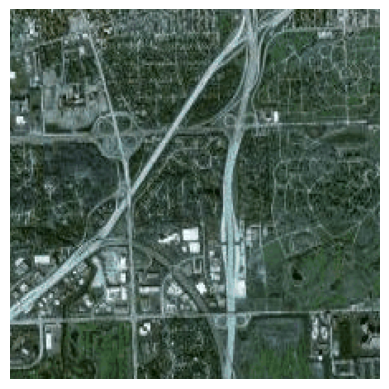

In [221]:
plt.imshow(util_image.center_crop(cv2.imread(image_list[9]), (224,224)))
plt.axis('off')
plt.show()

## 3. Saliency Map

In [11]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [22]:
random = True
load_target_var = 0
load_iterations = 200
load_target_var_val = 0
load_feature_viz = False

image_list = []

if random:
    for iterator in range(10):
        image_list.append(np.random.choice(all_test_images))
else:
    if load_feature_viz:
        files = glob.glob(out_dir+"image_samples/feature_viz/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                    model_run_date+"_*_"+
                    str(load_target_var)+"_"+str(load_target_var_val)+"_"+str(load_iterations)+".png")
        for f in files:
            image_list.append("/".join(all_test_images[0].split("/")[:-1] + ["_".join(f.split("/")[-1].split(".")[0].split("_")[5:9])+".png"]))
    else:

        files = glob.glob(out_dir+"image_samples/saliency/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                        model_run_date+"_*_"+str(target_var)+"_saliency.png")
        for f in files:
            image_list.append("/".join(all_test_images[0].split("/")[:-1] + ["_".join(f.split("/")[-1].split(".")[0].split("_")[4:8])+".png"]))

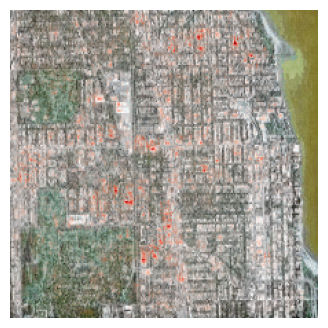

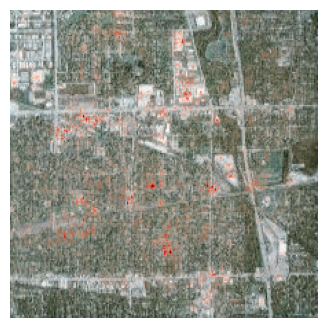

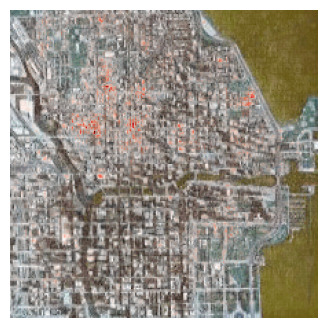

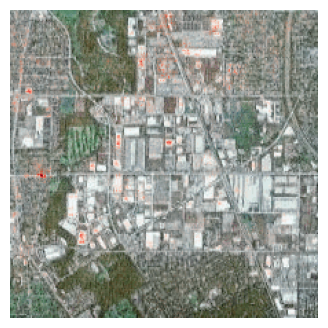

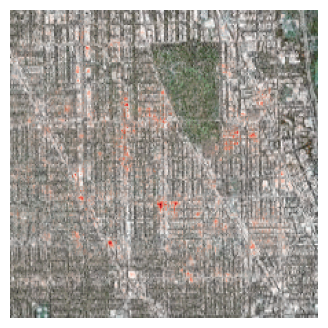

...

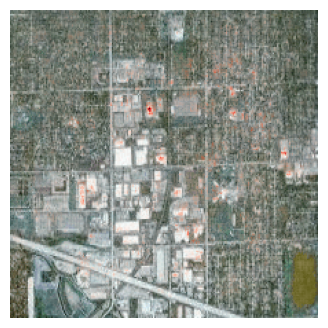

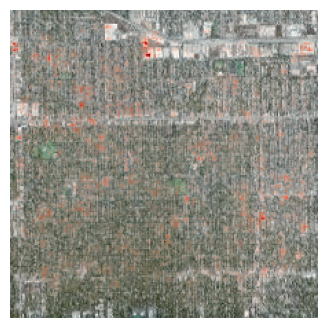

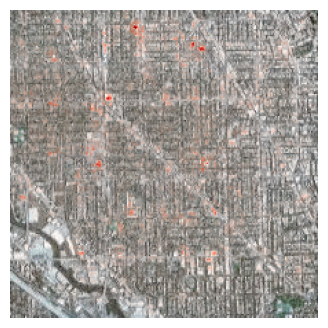

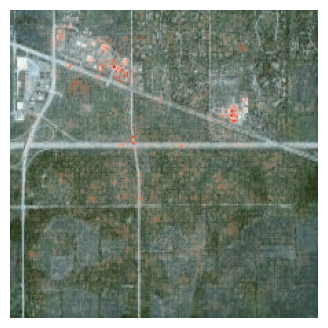

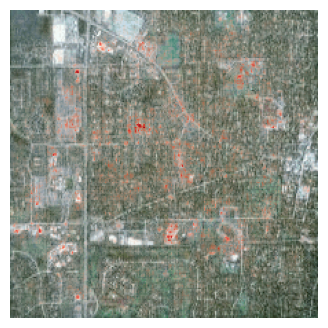

In [262]:
target_var = 0

for k in image_list:
    
    image_name = k.split("/")[-1].split(".")[0]

    sample = util_image.single_image_to_tensor_input(k, data_config['image_size'])
    sample = sample.to(device)
    sample.requires_grad=True

    enc = model(sample)
    auto_share = enc[1][0,target_var]

    auto_share.retain_grad()
    auto_share.backward(retain_graph=True)

    saliency,_ = torch.max(sample.grad.data.abs(), dim=1)
    saliency = saliency.reshape(224, 224)

    saliency = saliency.cpu().numpy()
    
#     saliency = saliency * (saliency >=np.percentile(saliency, 80))
#     alpha = (saliency - np.min(saliency[saliency>0])) / (saliency.max() - np.min(saliency[saliency>0]))
#     alpha = alpha * (alpha>0)

    alpha = np.sqrt(saliency) / np.sqrt(saliency).max()
    alpha = alpha * alpha 

    fig, ax = plt.subplots(1,1, figsize=(4,4))
    ax.imshow(util_image.center_crop(np.array(cv2.imread(k)), (224,224)))  
    ax.imshow(saliency, alpha = alpha, cmap='Reds')
    plt.axis('off')
#     plt.show()
    
    fig.savefig(out_dir+"image_samples/saliency/"+model_type+"_"+zoomlevel+"_"+str(output_dim**2*2048)+"_"+
                    model_run_date+"_"+
                    image_name+"_"+str(target_var)+"_saliency.png", 
                    bbox_inches='tight')
